In [38]:
import plotly.graph_objs as go
import plotly.offline as py
from matplotlib.path import Path
from ipywidgets import interactive, HBox, VBox
from dash import Dash, dcc, html, Input, Output
from plotly.graph_objs import FigureWidget

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

sc.set_figure_params(figsize=(8, 8))

%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

import warnings

warnings.filterwarnings('ignore')

In [3]:
#DSB normalized protein data

prot_norm = pd.read_csv('/Users/tiinatuononen/Desktop/Thesis/Project/model_down/data/EG10_norm_prot_exp.csv',index_col=0)

In [4]:
#CLR normalized protein data

prot_CLR_norm = pd.read_csv('/Users/tiinatuononen/Desktop/Thesis/Project/model_down/data/norm_prot_exp_clr.csv',index_col=0)


In [5]:
column_names=prot_norm.columns

In [6]:
column_names

Index(['CD19', 'CD10', 'CD20', 'CD3', 'CD2', 'CD11b', 'HLADR', 'CD38', 'CD11c',
       'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA',
       'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15',
       'CD64', 'CD117', 'CD24', 'CD44', 'CD58', 'CD66ace', 'CD13', 'CD34'],
      dtype='object')

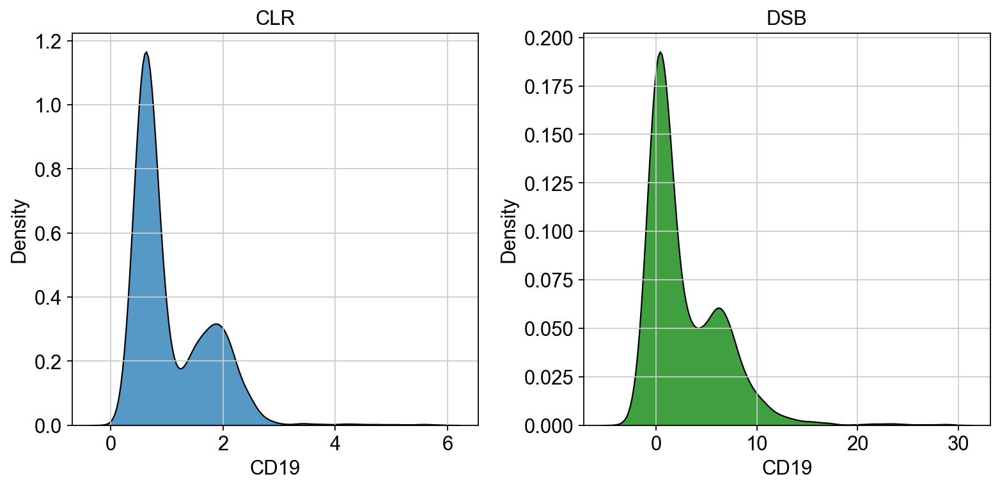

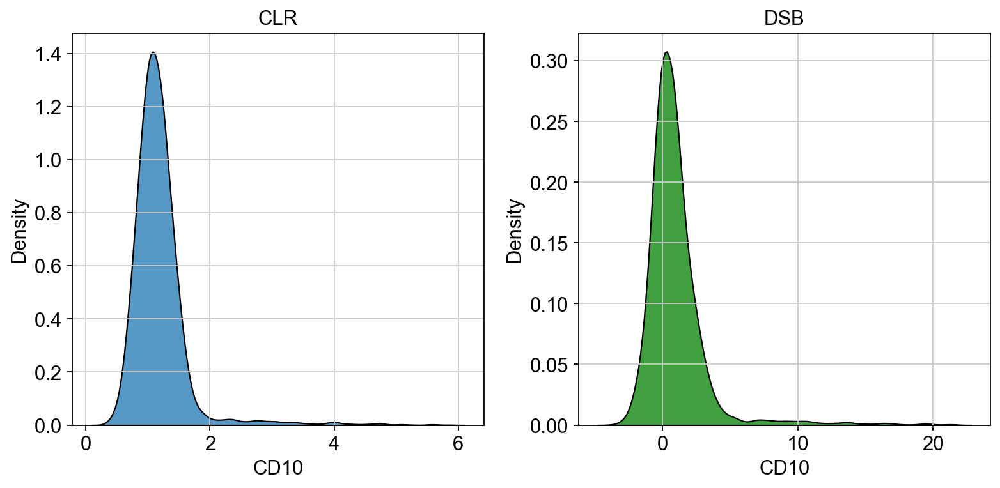

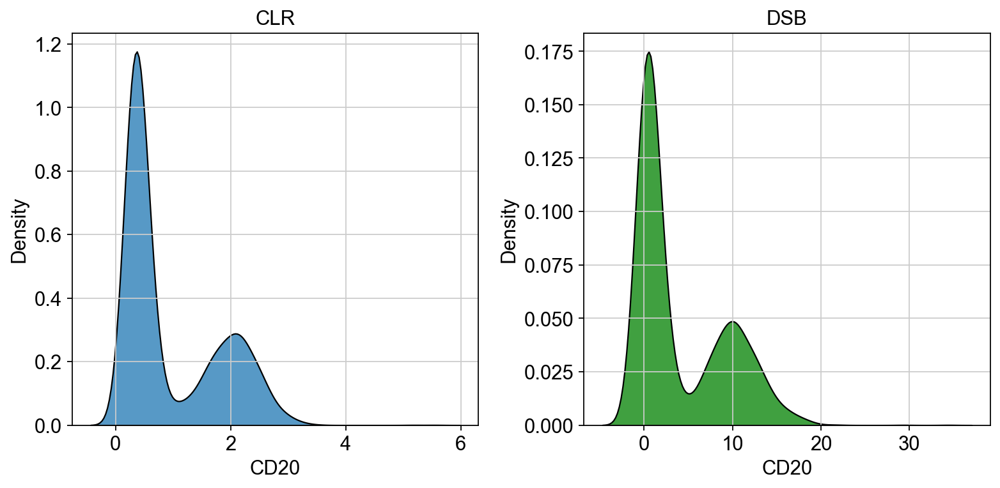

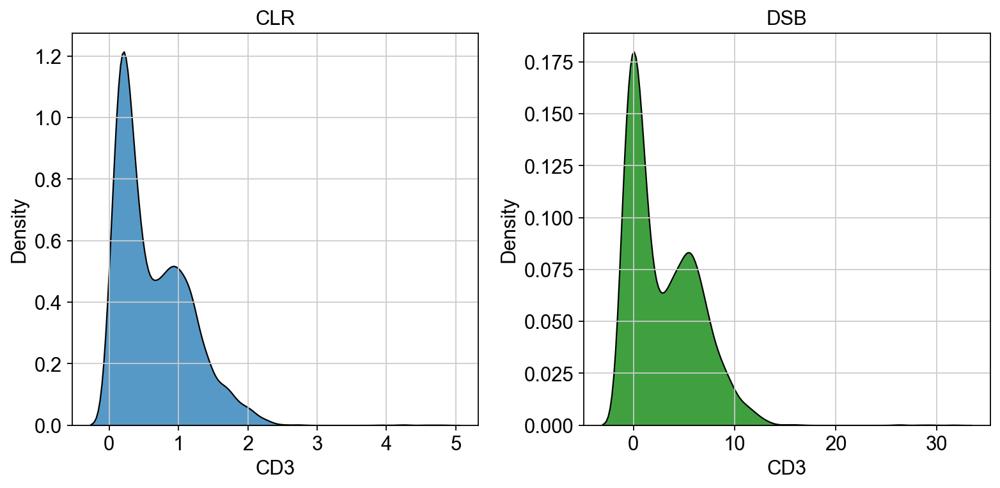

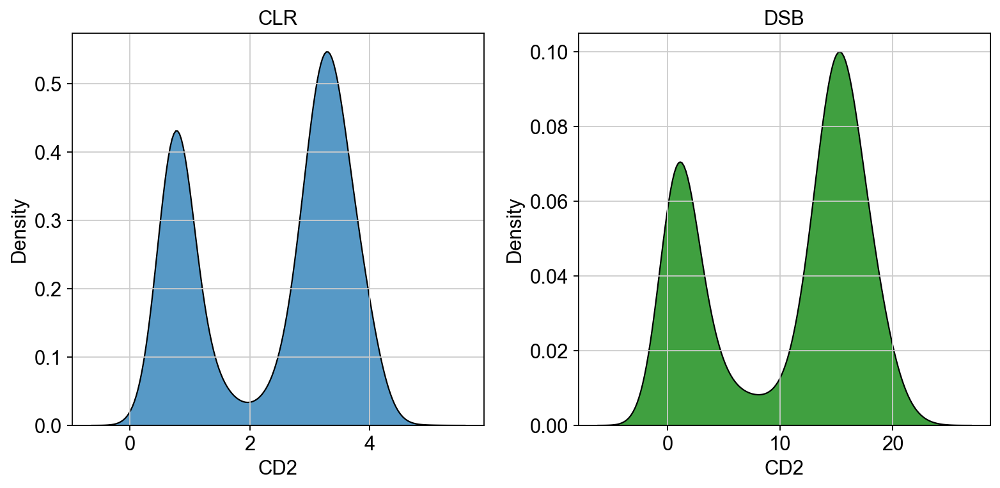

...

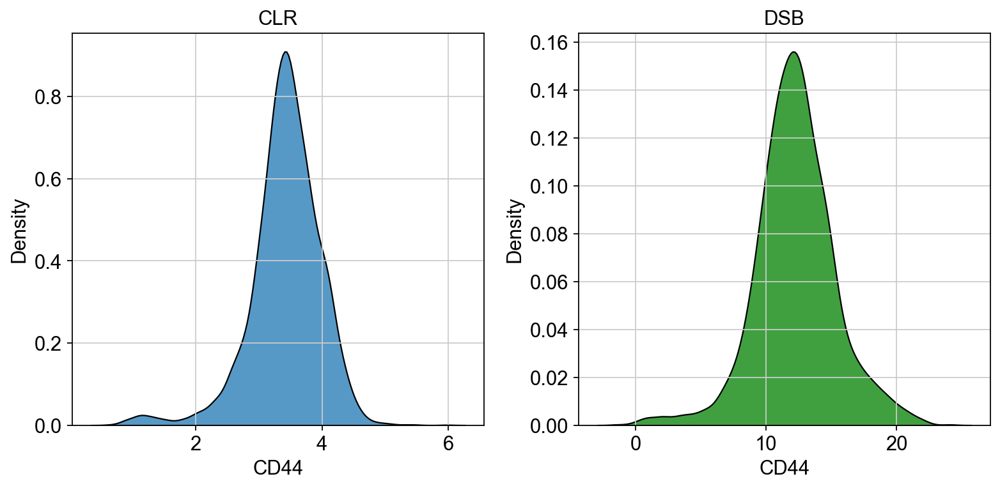

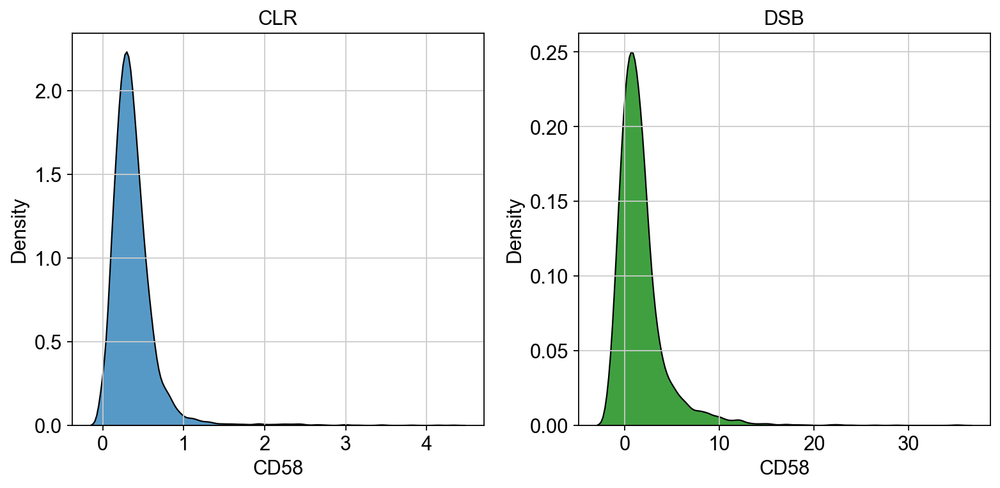

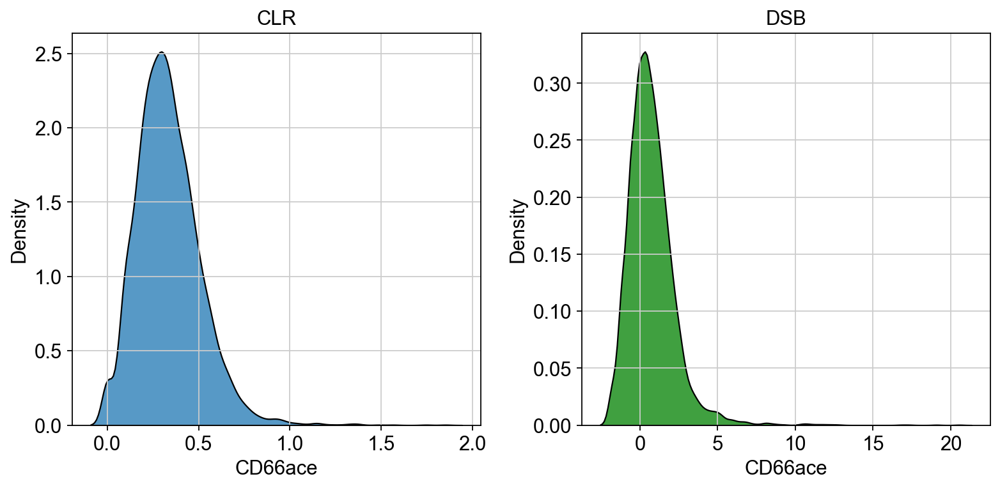

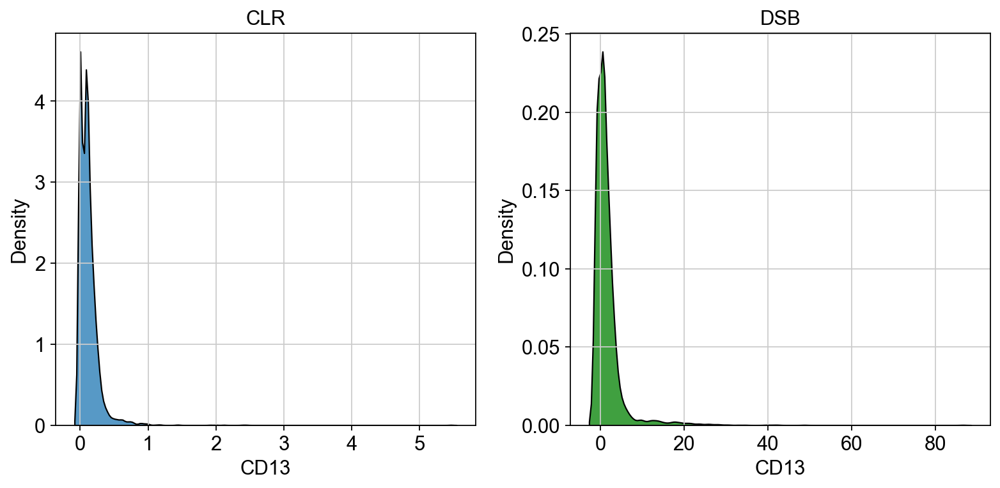

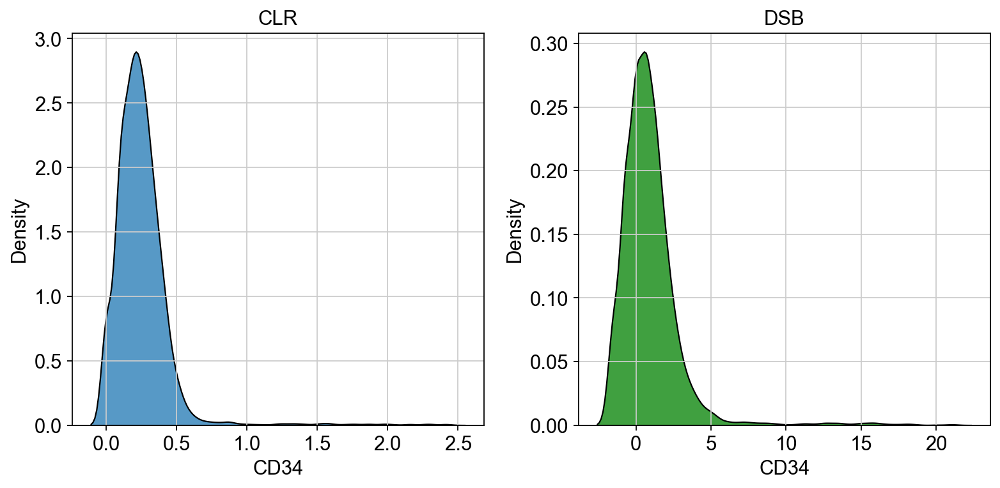

In [8]:
for column_name in column_names:
    fig, ax =plt.subplots(1,2,tight_layout=True, figsize=(10, 5))
    fig.show()

    ax2 = sns.kdeplot(data=prot_norm, x=column_name, multiple="stack", color="g", ax=ax[1]) ;
    ax1 = sns.kdeplot(data=prot_CLR_norm, x=column_name, multiple="stack", ax=ax[0]) ;


    ax1.title.set_text('CLR')    #headings for subplots
    ax2.title.set_text('DSB')
    plt.show()

# Clustering

## PCA

In [9]:
from sklearn.decomposition import PCA

#DSB normalized
pca_sc = PCA(n_components=0.95) # we can specify the number of components OR the desired minimum explained variance
prot_norm_pca = pca_sc.fit_transform(prot_norm)
print(prot_norm_pca.shape)
print(pca_sc.explained_variance_ratio_) 
print(pca_sc.explained_variance_ratio_.sum())
loadings = pca_sc.components_


#CLR normalized
pca_sc1 = PCA(n_components=0.95)
prot_CLR_norm_pca = pca_sc1.fit_transform(prot_CLR_norm)
print(prot_CLR_norm_pca.shape)
print(pca_sc1.explained_variance_ratio_) 
print(pca_sc1.explained_variance_ratio_.sum())

(6262, 20)
[0.31460989 0.18986897 0.11700603 0.08772586 0.06392455 0.02761123
 0.0241676  0.01687433 0.01509696 0.01422489 0.01162462 0.01000248
 0.00956159 0.00884889 0.00785135 0.00704145 0.00663606 0.00624043
 0.00602299 0.00565216]
0.9505923358092286
(6262, 18)
[0.4420323  0.14905795 0.08850839 0.06498042 0.03847559 0.02586819
 0.02078598 0.01862691 0.01553894 0.01475543 0.01279401 0.0117553
 0.01076877 0.0096743  0.00905743 0.00775339 0.0069011  0.00656852]
0.9539029336534407


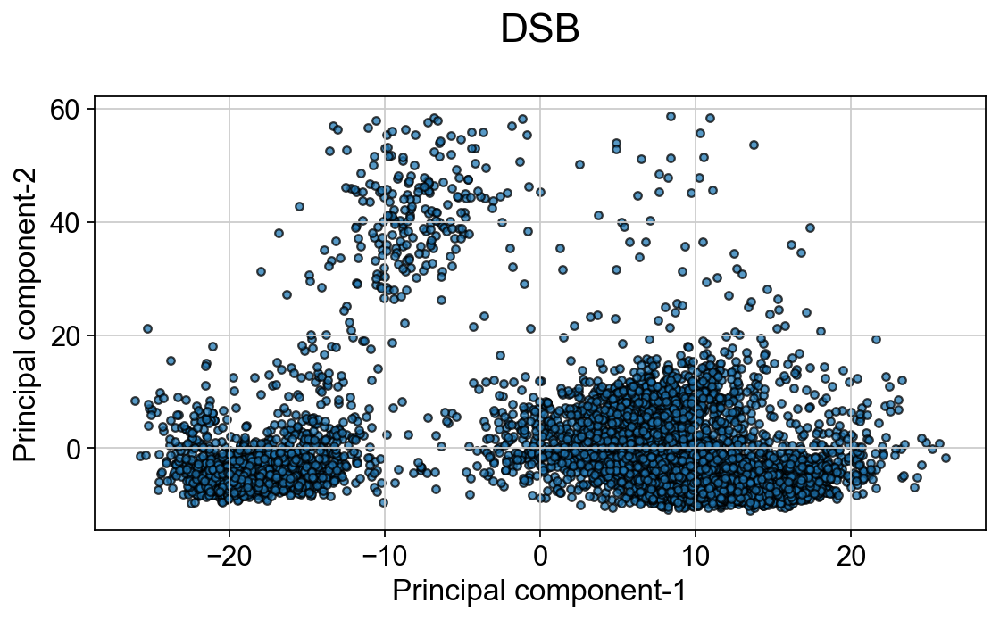

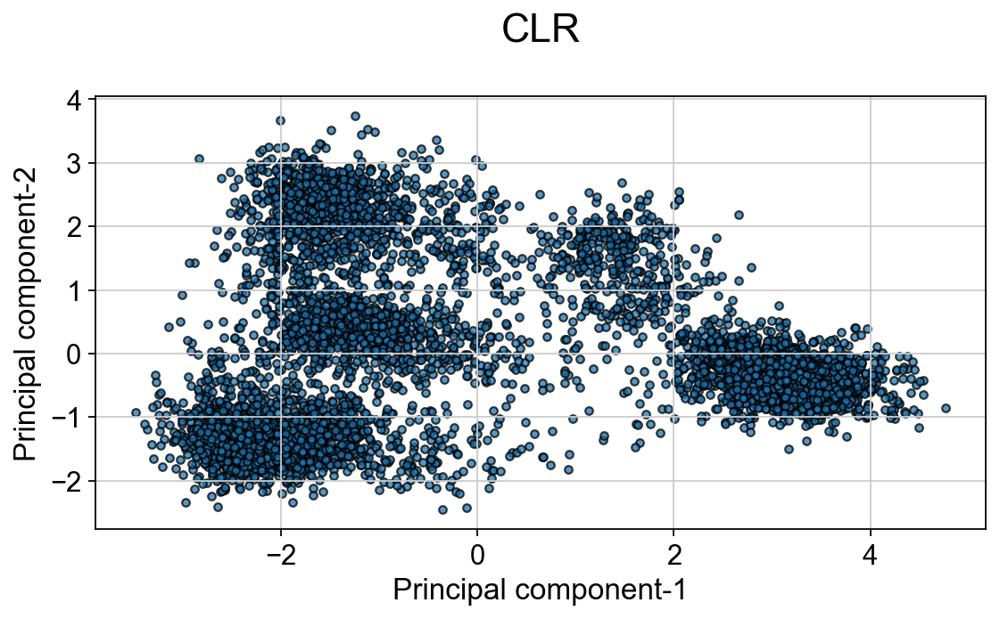

In [10]:
#DSB
plt.figure(figsize=(8,4))
plt.scatter(prot_norm_pca[:,0], prot_norm_pca[:,1], edgecolors='k',alpha=0.75,s=15)
plt.grid(True)
plt.title("DSB\n",fontsize=20)
plt.xlabel("Principal component-1",fontsize=15)
plt.ylabel("Principal component-2",fontsize=15)
plt.show()

#CLR

plt.figure(figsize=(8,4))
plt.scatter(prot_CLR_norm_pca[:,0], prot_CLR_norm_pca[:,1], edgecolors='k',alpha=0.75,s=15)
plt.grid(True)
plt.title("CLR\n",fontsize=20)
plt.xlabel("Principal component-1",fontsize=15)
plt.ylabel("Principal component-2",fontsize=15)
plt.show()


## Hierarchial clustering

In [11]:
from scipy.spatial.distance import pdist

#distance matrix for DSB
dist_data = pdist(prot_norm, 'correlation') #or Euclidean

print(type(dist_data))
print(dist_data.shape)

#distance matrix for CLR

dist_data1 = pdist(prot_CLR_norm, 'correlation') #or Euclidean

print(type(dist_data1))
print(dist_data1.shape)

<class 'numpy.ndarray'>
(19603191,)
<class 'numpy.ndarray'>
(19603191,)


In [12]:
#convert distance matrix to squareform

#DSB
from scipy.spatial.distance import squareform
dist_mat = squareform(dist_data)

#CLR
dist_mat_CLR = squareform(dist_data1)

In [13]:
from scipy.cluster.hierarchy import linkage

#calculate distances

#DSB

hc_complete = linkage(dist_data, "complete") #or average or single

#CLR
hc_complete_CLR = linkage(dist_data1, "complete") #or average or single



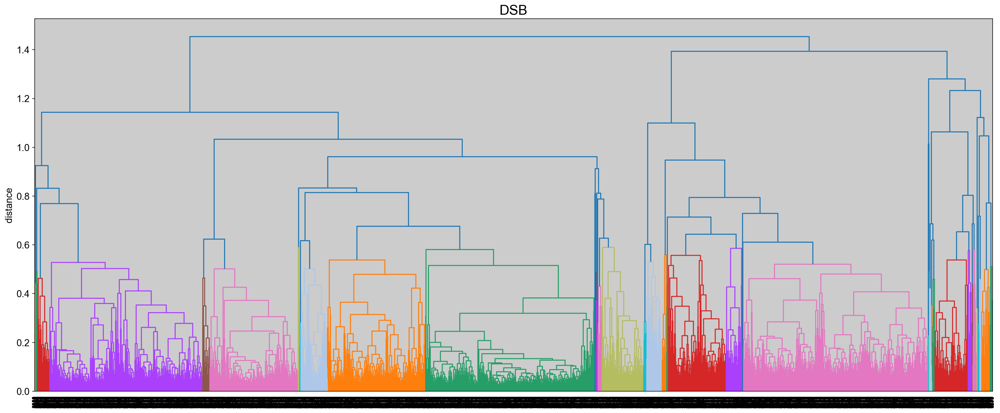

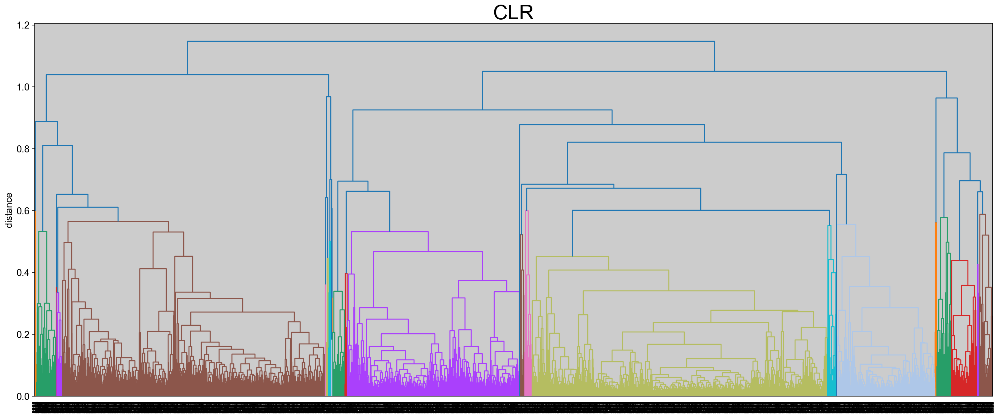

In [14]:
from scipy.cluster.hierarchy import dendrogram

# DSB
plt.figure(figsize=(25, 10))
plt.title('DSB', fontsize=20)
#plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    hc_complete,
    color_threshold=0.6,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()


#CLR

plt.figure(figsize=(25, 10))
plt.title('CLR', fontsize=30)
#plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    hc_complete_CLR,
    color_threshold=0.6,
    leaf_rotation=90.,  
    leaf_font_size=8.,  
)
plt.show()

## tSNE

In [15]:
from sklearn.manifold import TSNE

In [16]:
#DSB
tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=1000)
tsne_results_DSB = tsne.fit_transform(prot_norm)

#CLR
tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=1000)
tsne_results_CLR = tsne.fit_transform(prot_CLR_norm)

In [17]:
tsne_results_DSB.shape

(6262, 2)

In [18]:
#DSB
tsnedf_DSB = pd.DataFrame(tsne_results_DSB[:,:2], columns=["TSNE1", "TSNE2"])

#CLR
tsnedf_CLR = pd.DataFrame(tsne_results_CLR[:,:2], columns=["TSNE1", "TSNE2"])

In [19]:
tsnedf_DSB.head()

,TSNE1,TSNE2
0,20.486143,41.615677
1,5.580806,-23.398905
2,14.582111,28.880873
3,22.050594,-28.586945
4,11.639171,-20.436686


In [20]:
tsnedf_CLR.head()

,TSNE1,TSNE2
0,-38.634869,-1.578559
1,25.102974,39.354343
2,-48.439514,15.851878
3,12.347955,50.039227
4,12.452472,39.810474


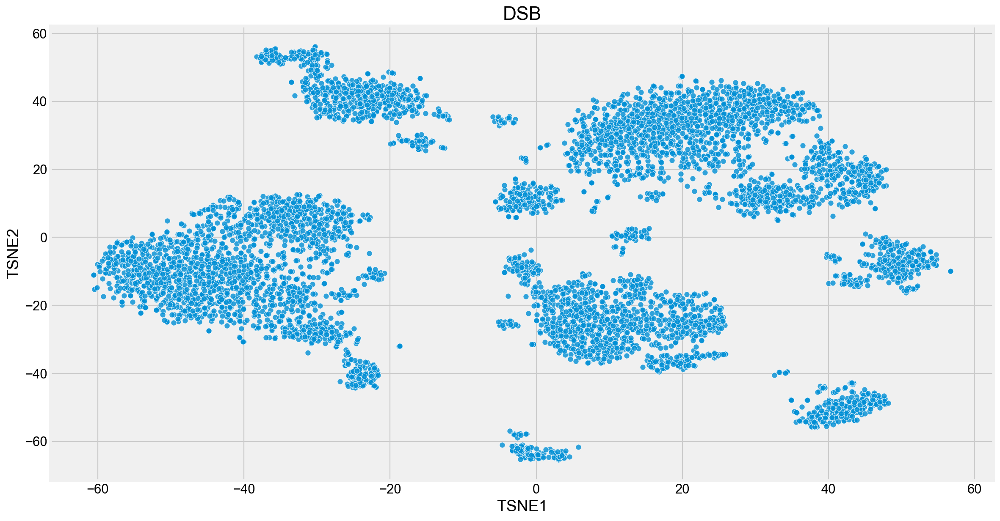

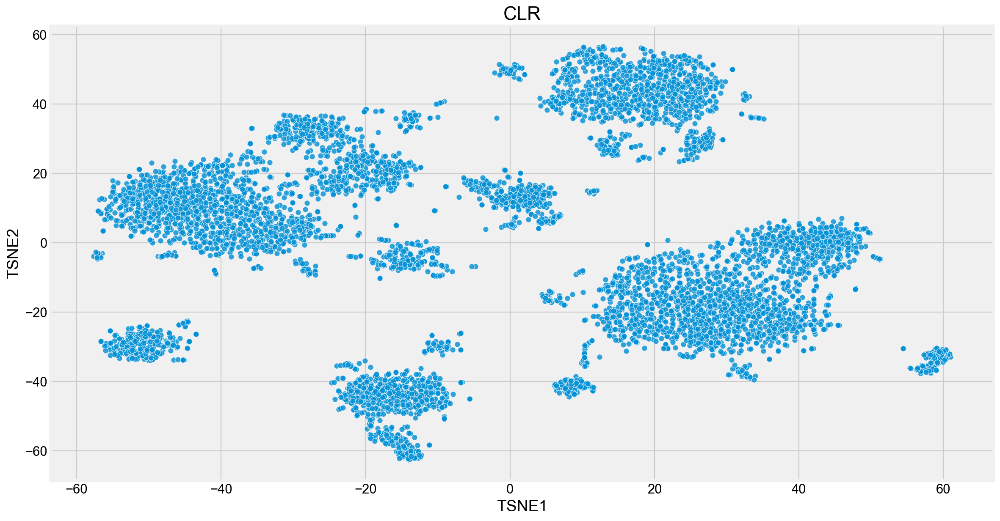

In [21]:
#DSB

plt.style.use("fivethirtyeight")
plt.figure(figsize=(16,8))
plt.title('DSB', fontsize=20)
sns.scatterplot(
    x = 'TSNE1', y = 'TSNE2',
    palette = sns.color_palette("husl", 5),
    data = tsnedf_DSB,
    legend = "full",
    alpha = 0.8
)

plt.show()

#CLR
plt.style.use("fivethirtyeight")
plt.figure(figsize=(16,8))
plt.title('CLR', fontsize=20)
sns.scatterplot(
    x = 'TSNE1', y = 'TSNE2',
    palette = sns.color_palette("husl", 5),
    data = tsnedf_CLR,
    legend = "full",
    alpha = 0.8
)
plt.show()



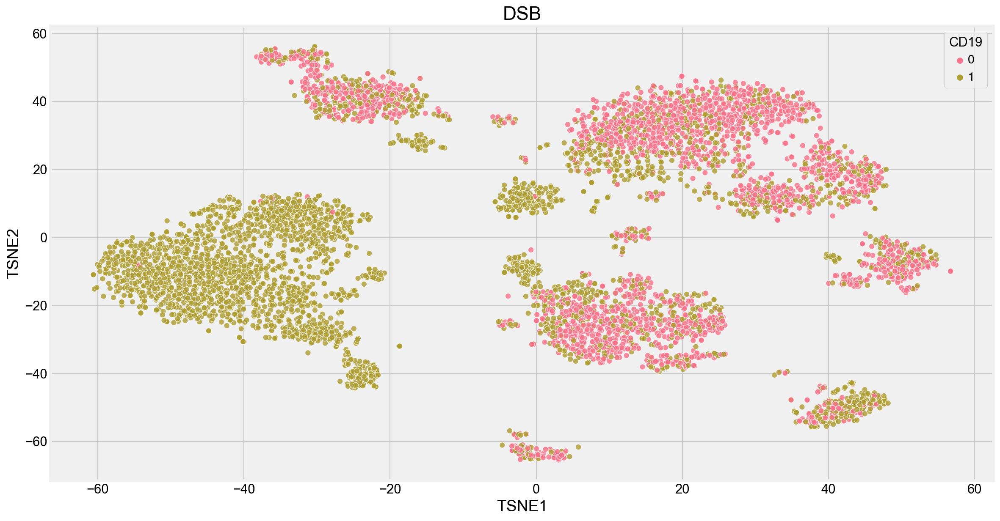

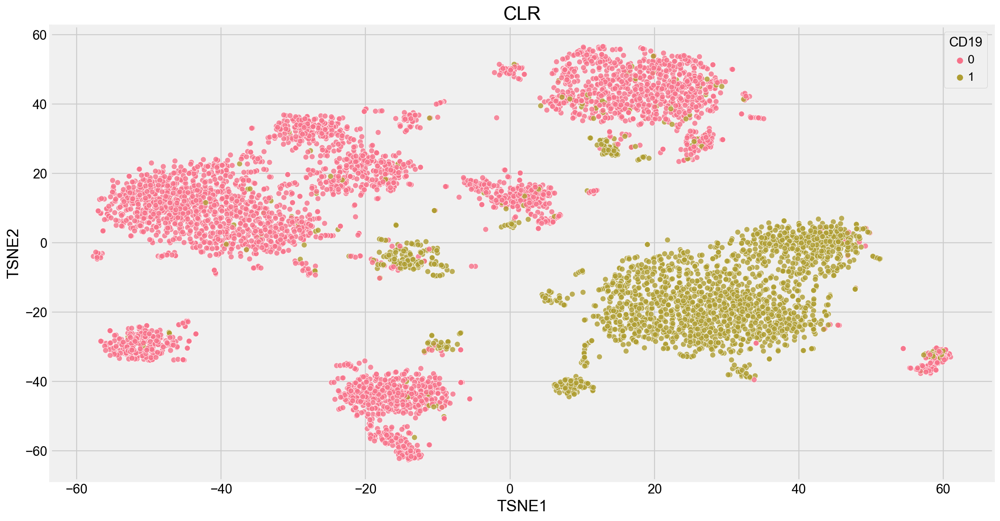

In [22]:
#Extract protein of interest from tSNE

#DSB

plt.style.use("fivethirtyeight")
plt.figure(figsize=(16,8))
plt.title('DSB', fontsize=20)
sns.scatterplot(
    x = 'TSNE1', y = 'TSNE2',
    palette = sns.color_palette("husl", 5),
    data = tsnedf_DSB,
    legend = "full",
    alpha = 0.8,
    hue=(prot_norm.CD19.reset_index(drop=True) > 1).astype(int)
)

plt.show()


#CLR
plt.style.use("fivethirtyeight")
plt.figure(figsize=(16,8))
plt.title('CLR', fontsize=20)
sns.scatterplot(
    x = 'TSNE1', y = 'TSNE2',
    palette = sns.color_palette("husl", 5),
    data = tsnedf_CLR,
    legend = "full",
    alpha = 0.8,
    hue = (prot_CLR_norm.CD19.reset_index(drop=True) > 1).astype(int)
)
plt.show()

In [23]:
(prot_CLR_norm.CD19.reset_index(drop=True) > 1).astype(int)   #indexes were not matching

0       0
1       0
2       0
3       0
4       0
       ..
6257    0
6258    0
6259    1
6260    1
6261    0
Name: CD19, Length: 6262, dtype: int64

## UMAP

In [24]:
reducer = umap.UMAP() #model

In [25]:
embedding = reducer.fit_transform(prot_norm) #fit the data

embedding2=reducer.fit_transform(prot_CLR_norm)

In [26]:
embedding.shape

(6262, 2)

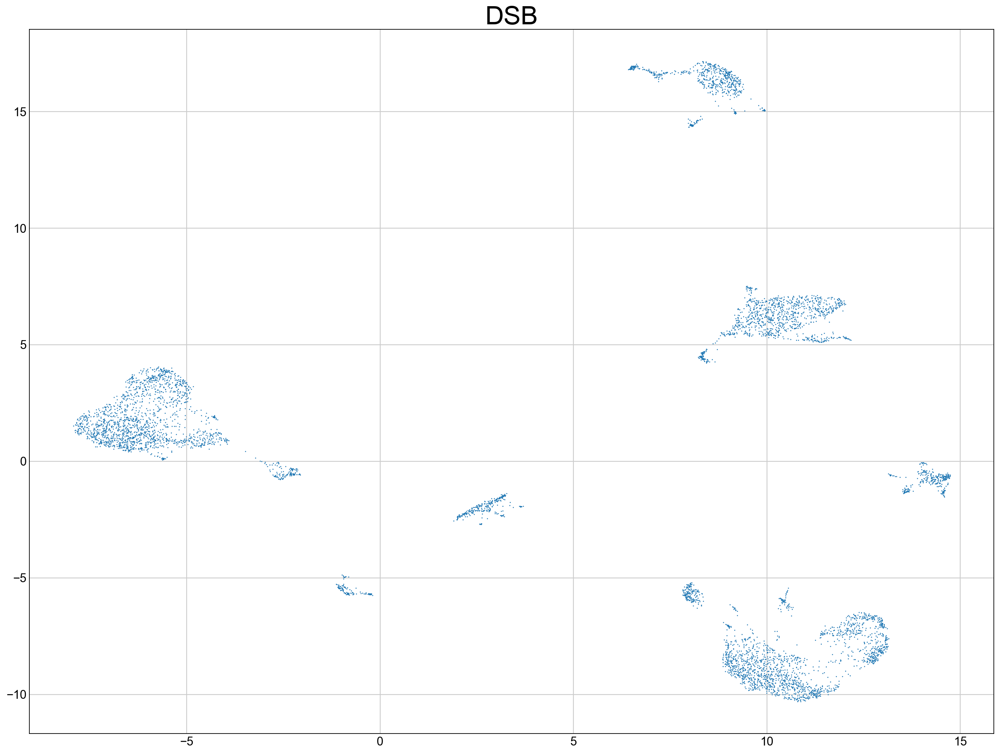

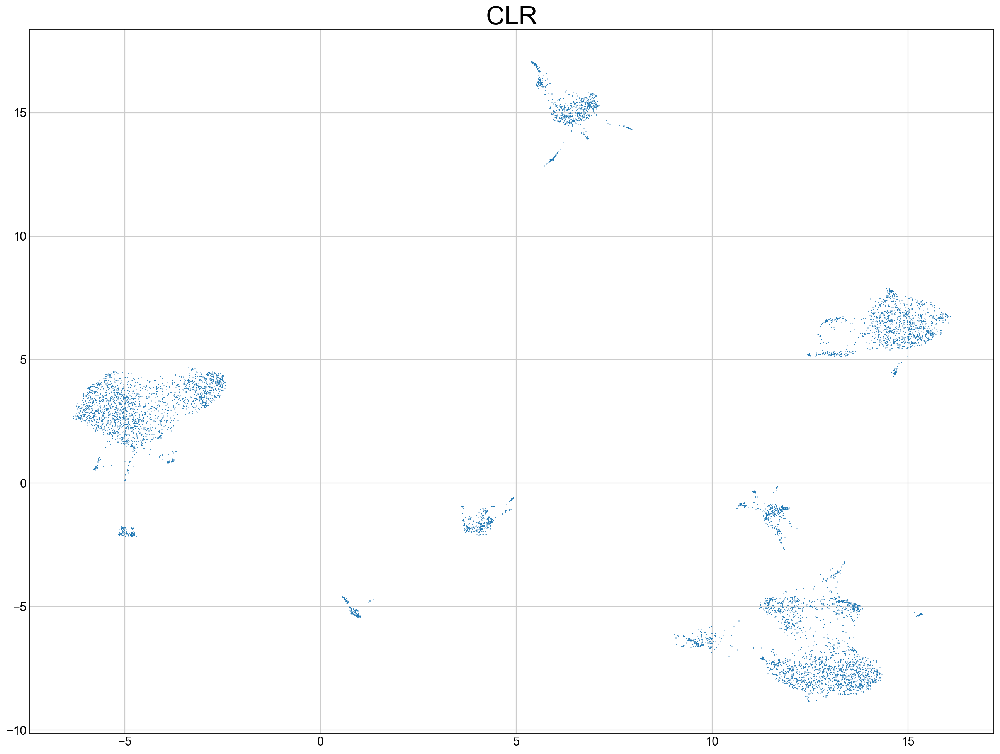

In [41]:
#DSB
plt.figure(figsize=(20,15))
plt.title('DSB', fontsize=30)
plt.scatter(embedding[:, 0], embedding[:, 1], s=0.5);

#CLR
plt.figure(figsize=(20,15))
plt.title('CLR', fontsize=30)
plt.scatter(embedding2[:, 0], embedding2[:, 1],s=0.5);

# GMM to identify foreground and background

In [42]:
import flowkit as fk
import pylab as pl
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import FlowCal as fc
import sklearn.mixture

sns.set_theme(style="ticks")
import warnings
warnings.filterwarnings('ignore')

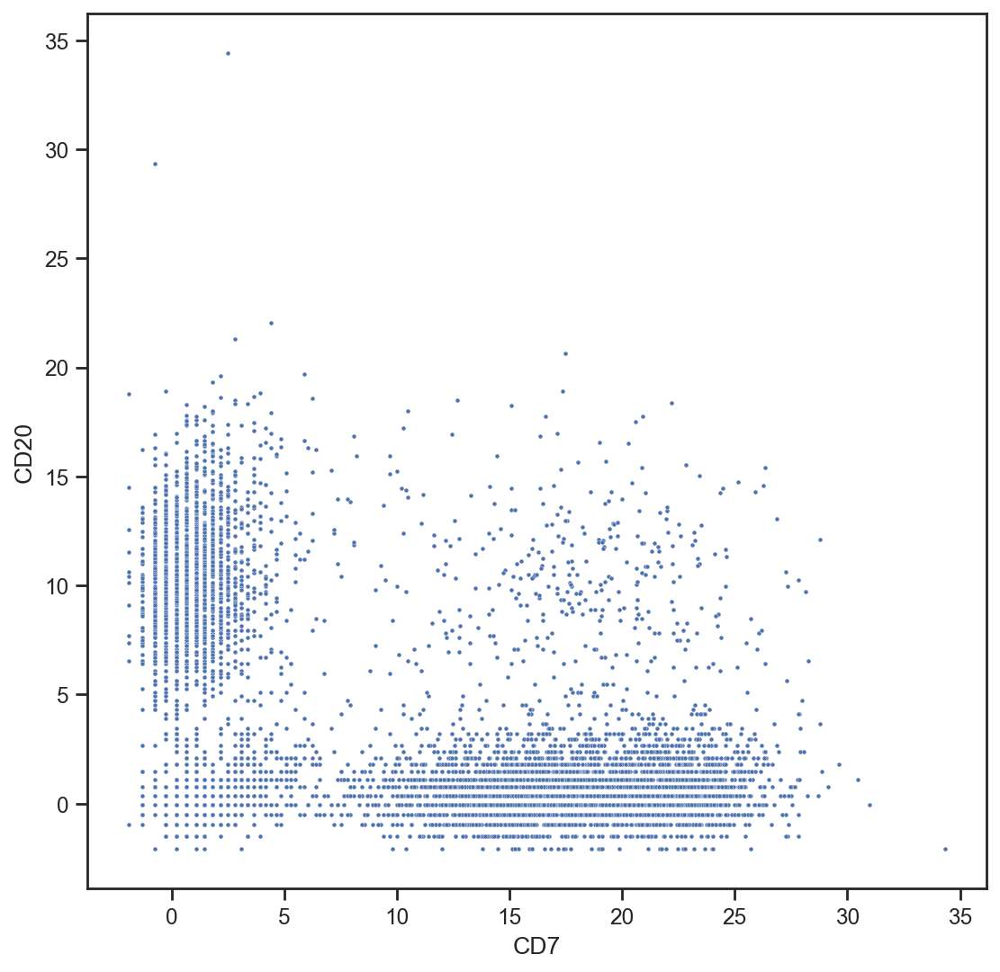

In [49]:
#Scatterplots

x = prot_norm["CD7"]
y= prot_norm["CD20"]


#defining the model
gmm = sklearn.mixture.GaussianMixture(n_components = 2,
                                      covariance_type = "full",
                                      random_state = 42) 


sns.scatterplot(data=prot_norm, x=x, y=y, s=5) ;

In [45]:
#to numpy

x=x.values.reshape(-1, 1)

print(x)

AttributeError: 'numpy.ndarray' object has no attribute 'values'

In [46]:
#model fit

gmm.fit(x)

GaussianMixture(n_components=2, random_state=42)

In [47]:
#prediction

labels = gmm.predict(x)

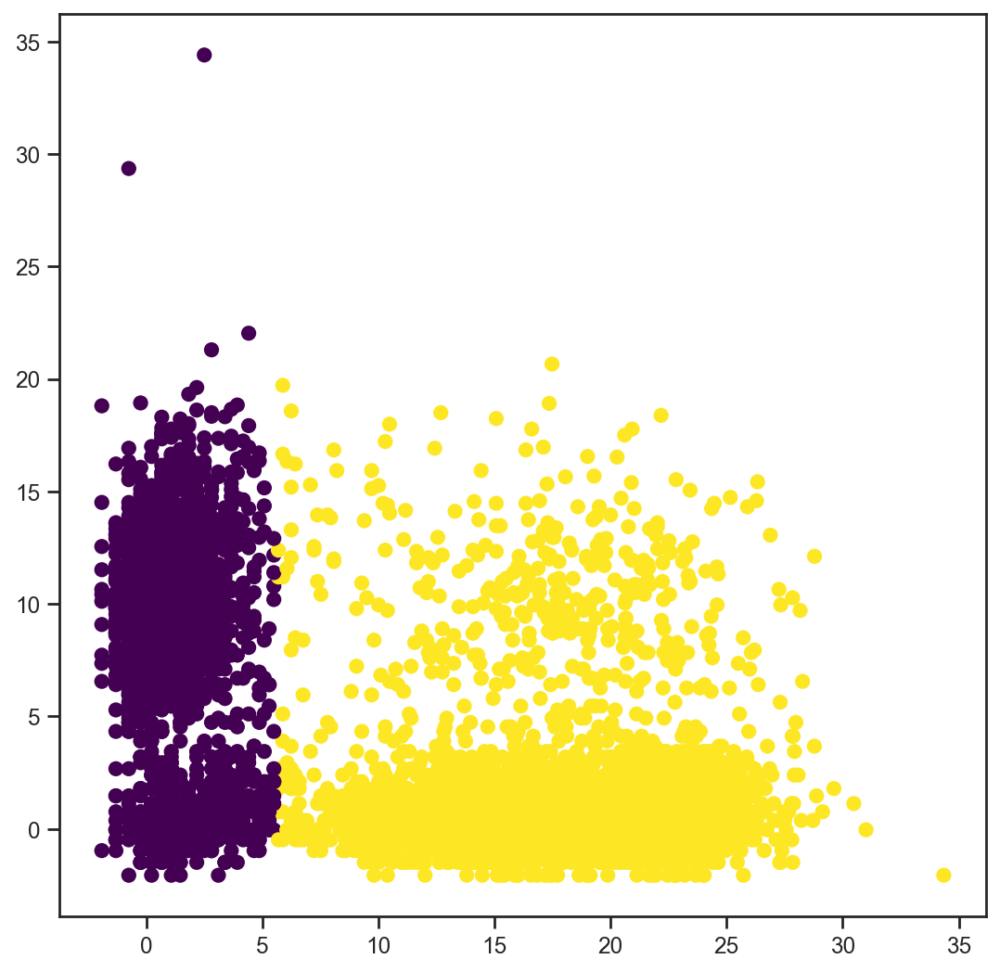

In [48]:
#visualization of the predictions

plt.scatter(x, y, c=labels, s=40, cmap='viridis');

<AxesSubplot: xlabel='CD19', ylabel='Density'>

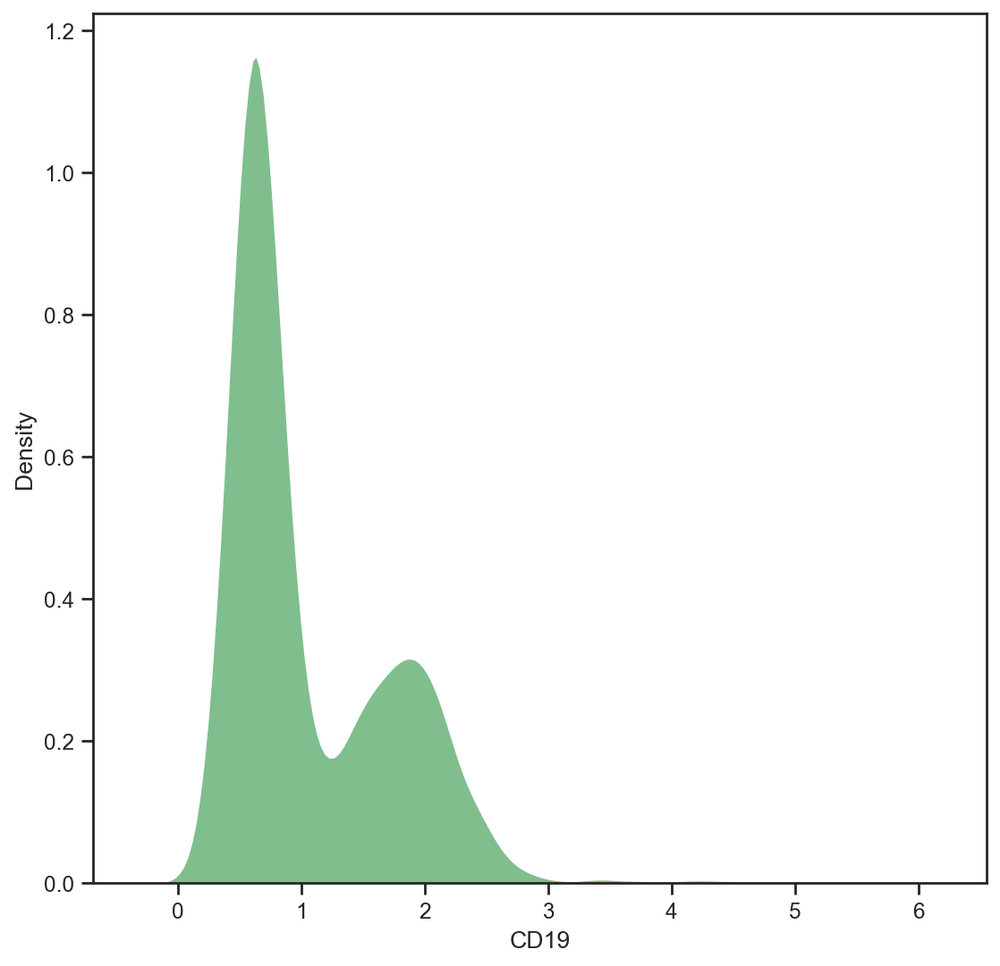

In [50]:
#example when applying to density plots

x1 = prot_CLR_norm["CD19"]


gmm = sklearn.mixture.GaussianMixture(n_components = 2,
                                      covariance_type = "full",
                                      random_state = 42)

sns.kdeplot(data=prot_CLR_norm, x="CD19", multiple="stack", color="g")

In [51]:
#to numpy

x1=x1.values.reshape(-1, 1)

print(x1)

[[0.31227784]
 [0.78972246]
 [0.76379091]
 ...
 [2.14428913]
 [1.45591994]
 [0.52202966]]


In [52]:
#model fit

gmm.fit(x1)

GaussianMixture(n_components=2, random_state=42)

In [53]:
labels1 = gmm.predict(x1)

<AxesSubplot: xlabel='CD19', ylabel='Density'>

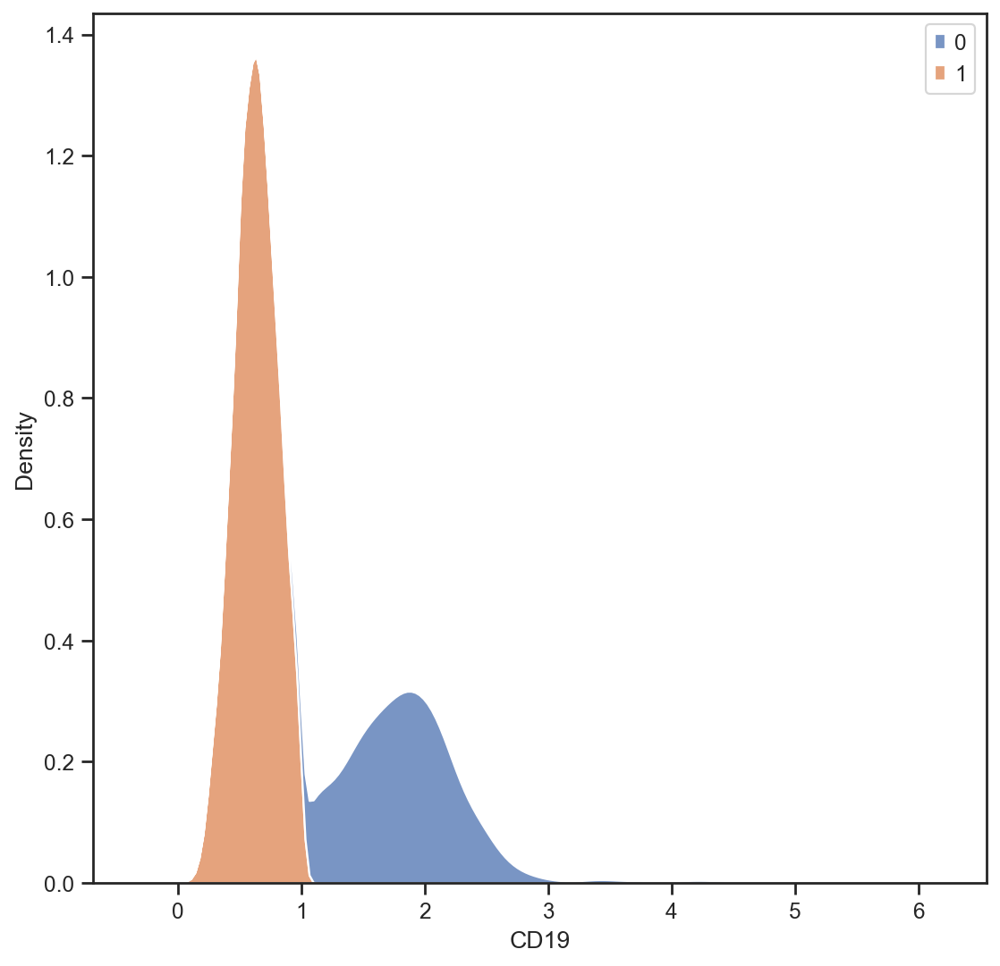

In [54]:
#visualization of the results

sns.kdeplot(data=prot_CLR_norm, x="CD19", multiple="stack", hue=labels1)

In [55]:
#Calculating the proportions of negative (0) and positive (1) cells

print(labels1)

[1 1 1 ... 0 0 1]


In [56]:
# counting all zeros in arr 

n_zeros = np.count_nonzero(labels1==0)

print(n_zeros)

#percentages 

n_cells=labels1.shape

print(n_cells)

result_zeros=(n_zeros/6262 * 100)

print("The percentage of 0s = ""{:.2f}".format(result_zeros))



2280
(6262,)
The percentage of 0s = 36.41


In [57]:
print(np.count_nonzero(labels1))

3982


In [58]:
#counting all 1s 

n_ones=(np.count_nonzero(labels1))

print(n_ones)

#percentages

result_ones=(n_ones/6262 * 100)

print("The percentage of 1s = " "{:.2f}".format(result_ones))



3982
The percentage of 1s = 63.59


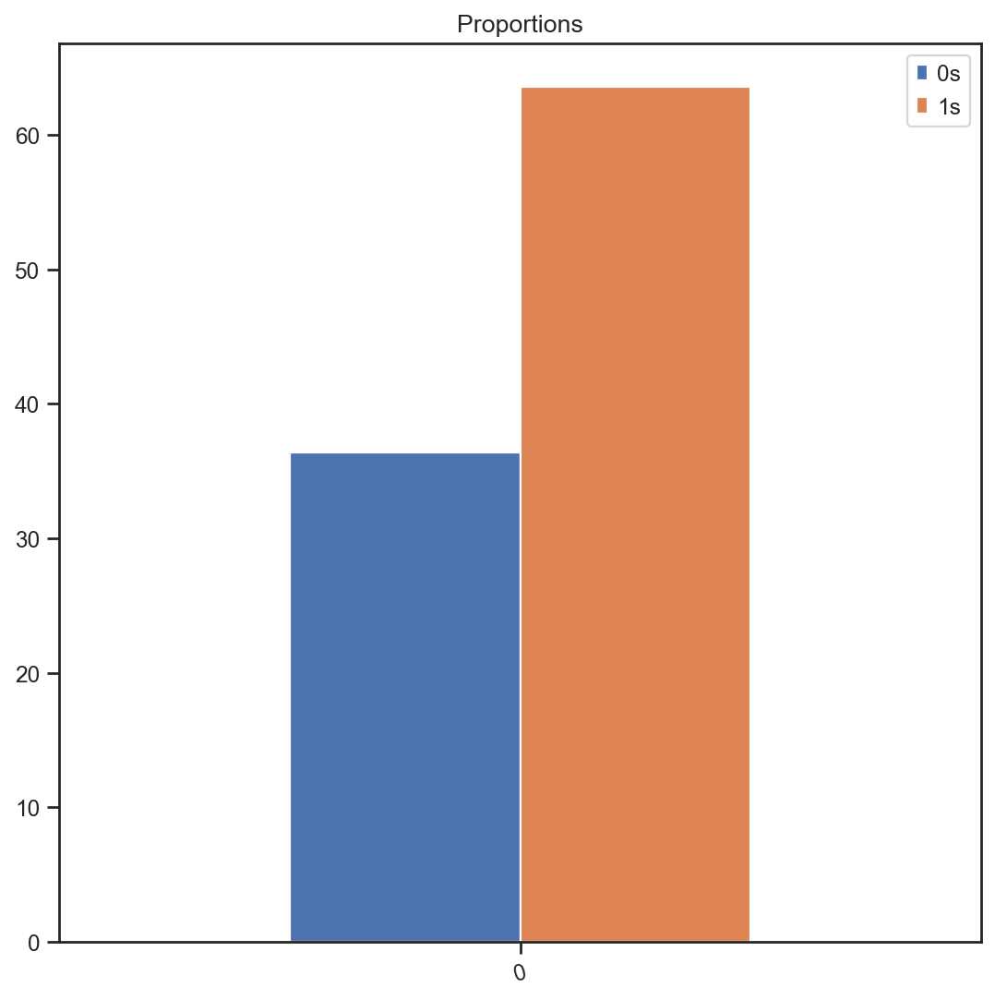

In [59]:
data = {"0s":[result_zeros],
        "1s":[result_ones]

        };

dataFrame = pd.DataFrame(data=data);

dataFrame.plot.bar(rot=15, title="Proportions");


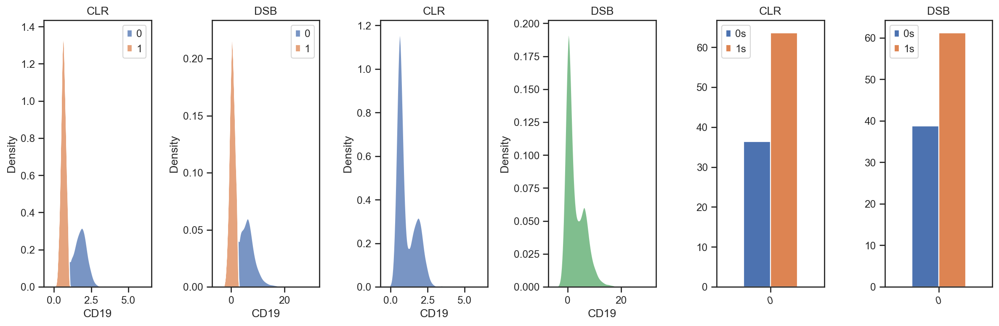

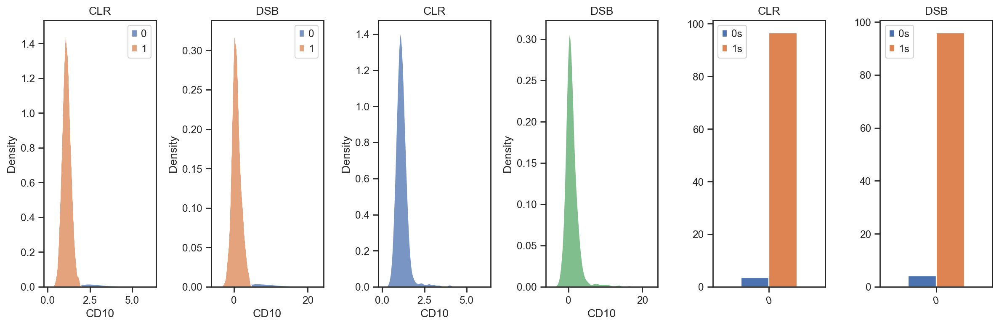

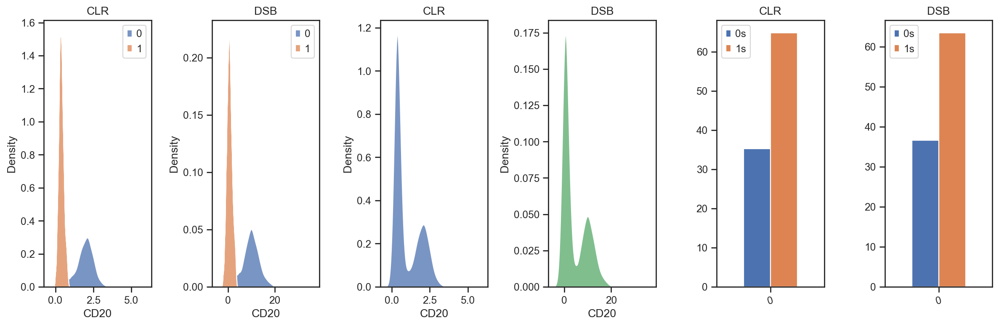

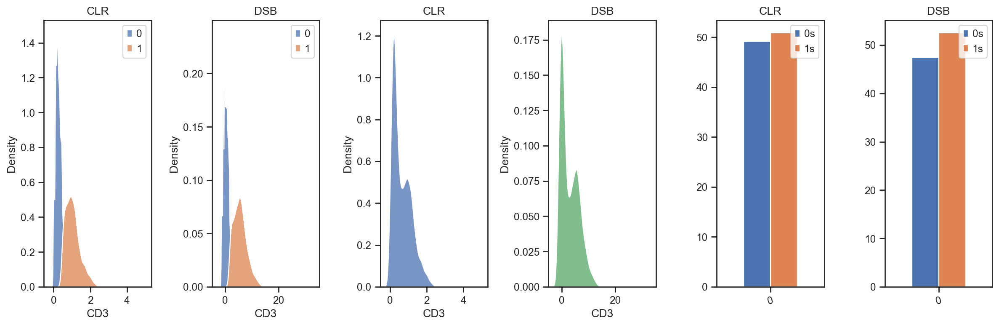

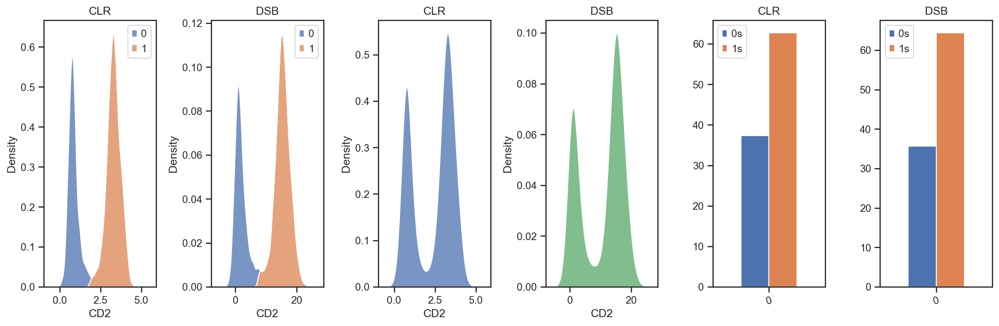

...

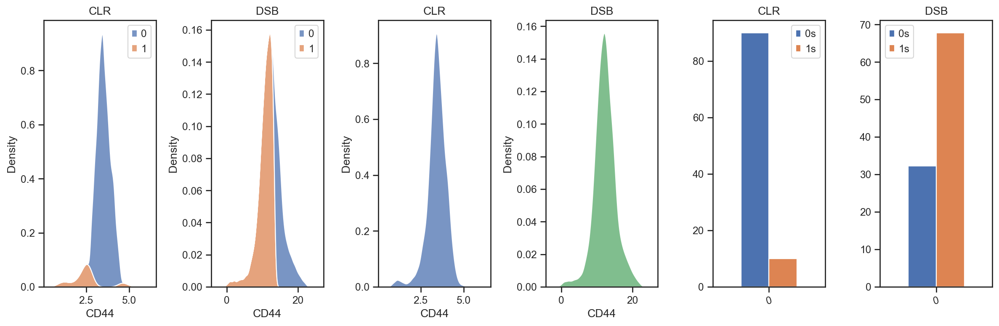

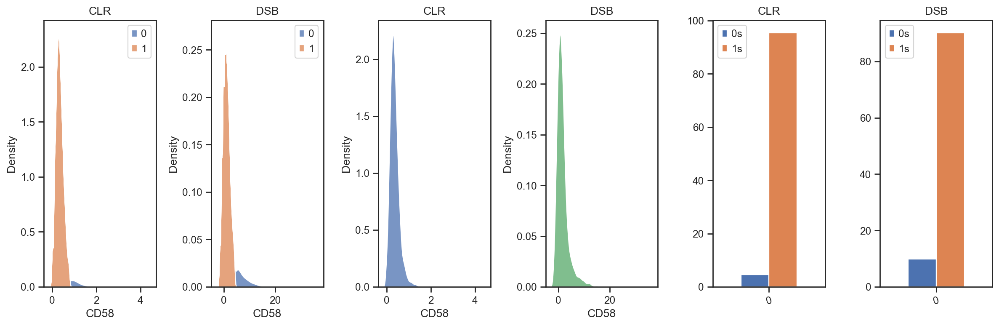

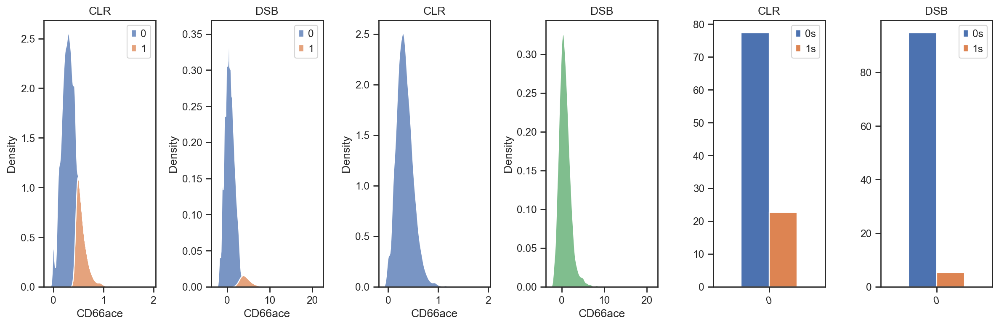

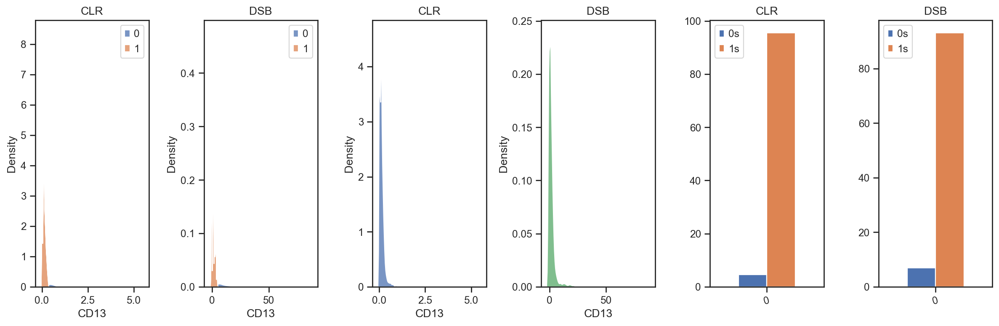

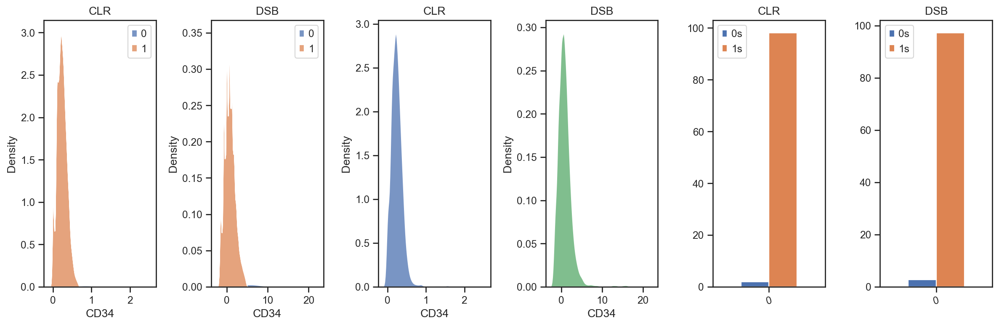

In [60]:
for column_name in column_names:
    fig, ax =plt.subplots(1,6,tight_layout=True, figsize=(15, 5))
    fig.show()
    
    #CLR
    x_CLR= prot_CLR_norm[column_name]
    x_CLR=x_CLR.values.reshape(-1, 1)
    gmm.fit(x_CLR)
    labels_CLR = gmm.predict(x_CLR)
    
    ax1 = sns.kdeplot(data=prot_CLR_norm, x=column_name, hue=labels_CLR, multiple="stack", ax=ax[0]) ;


    #DSB
    x_DSB = prot_norm[column_name]
    x_DSB=x_DSB.values.reshape(-1, 1)
    gmm.fit(x_DSB)
    labels_DSB = gmm.predict(x_DSB)
    
    ax2 = sns.kdeplot(data=prot_norm, x=column_name, hue=labels_DSB, multiple="stack", color="g", ax=ax[1]) ;
    
    #Original density plots
    ax3 = sns.kdeplot(data=prot_CLR_norm, x=column_name, multiple="stack", ax=ax[2]) ;
    ax4 = sns.kdeplot(data=prot_norm, x=column_name, multiple="stack", color="g", ax=ax[3]) ;

    
    ax1.title.set_text('CLR')    #headings for subplots
    ax2.title.set_text('DSB')
    ax3.title.set_text('CLR')    #headings for subplots
    ax4.title.set_text('DSB')
    
    #Calculate zeros
    n_zeros1 = np.count_nonzero(labels_CLR==0)
    n_zeros2 = np.count_nonzero(labels_DSB==0)
    n_cells=labels1.shape
    result_zeros_CLR=(n_zeros1/6262 * 100)
    result_zeros_DSB=(n_zeros2/6262 * 100)
    #Calculate ones
    n_ones_CLR=np.count_nonzero(labels_CLR)
    n_ones_DSB=np.count_nonzero(labels_DSB)
    #percentages
    result_ones_CLR=(n_ones_CLR/6262 * 100)
    result_ones_DSB=(n_ones_DSB/6262 * 100)
    #Dataframes
    data_CLR = {"0s":[result_zeros_CLR],
        "1s":[result_ones_CLR]
        };

    dataFrame_CLR = pd.DataFrame(data=data_CLR)
    
    data_DSB = { "0s":[result_zeros_DSB],
        "1s":[result_ones_DSB]
        };
    dataFrame_DSB = pd.DataFrame(data=data_DSB)
    
    ax5= dataFrame_CLR.plot.bar(rot=15, title=column_name, ax=ax[4]);
    ax6= dataFrame_DSB.plot.bar(rot=15, title=column_name, ax=ax[5]);

    ax5.title.set_text('CLR')    #headings for subplots
    ax6.title.set_text('DSB')
    plt.show()
    
    
    plt.show()